# **GENDER DETECTION MODEL**


---


**Importing Libraries**


---



In [46]:
import os
import cv2
import numpy as np
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow



---

**Load and preprocess the dataset**


---



In [47]:
DATASET_PATH = '/content/drive/MyDrive/test'
categories = ['male', 'female']
img_size = 100

# function to preprocess the data
def load_images(dataset_path, categories, img_size):
    data = []
    labels = []
    for label, category in enumerate(categories):
        folder_path = os.path.join(dataset_path, category)
        images = os.listdir(folder_path)
        random.shuffle(images)
        for img_file in images:
            try:
                img_path = os.path.join(folder_path, img_file)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                img = cv2.resize(img, (img_size, img_size))
                data.append(img)
                labels.append(label)
            except Exception as e:
                print(f"Error loading image {img_file}: {e}")
    return np.array(data), np.array(labels)


images, labels = load_images(DATASET_PATH, categories, img_size)
images = images / 255.0  # Normalize pixel values
labels = to_categorical(labels, num_classes=len(categories))

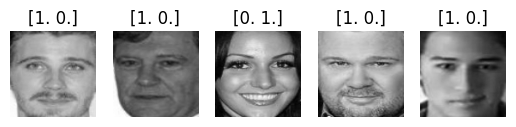

In [102]:
image_labels = list(zip(images, labels))
random_images = random.sample(image_labels, 5)


for i, (image, label) in enumerate(random_images):
    plt.subplot(1, 5, i+1)
    plt.imshow(image, cmap='gray')
    plt.title(label)
    plt.axis('off')

plt.show()



---


**Split dataset into training and testing sets**


---



In [48]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.1, stratify=labels, random_state=42)

# Reshape images for the model
X_train = X_train.reshape(-1, img_size, img_size, 1)
X_test = X_test.reshape(-1, img_size, img_size, 1)



---

**Build CNN Model**


---



In [49]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(img_size, img_size, 1)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(2, activation='softmax')  # Two classes: male and female
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)




---

**Train the Model using traing set**


---



In [54]:
history = model.fit(X_train, y_train, validation_split=0.1, epochs=15, batch_size=16, verbose=1)

Epoch 1/15
35/35 ━━━━━━━━━━━━━━━━━━━━ 10s 276ms/step - accuracy: 0.9781 - loss: 0.0769 - val_accuracy: 0.8710 - val_loss: 0.4378
Epoch 2/15
35/35 ━━━━━━━━━━━━━━━━━━━━ 10s 276ms/step - accuracy: 0.9805 - loss: 0.0683 - val_accuracy: 0.8548 - val_loss: 0.8822
Epoch 3/15
35/35 ━━━━━━━━━━━━━━━━━━━━ 8s 217ms/step - accuracy: 0.9839 - loss: 0.0626 - val_accuracy: 0.8710 - val_loss: 0.8354
Epoch 4/15
35/35 ━━━━━━━━━━━━━━━━━━━━ 10s 298ms/step - accuracy: 0.9806 - loss: 0.0510 - val_accuracy: 0.8710 - val_loss: 0.6183
Epoch 5/15
35/35 ━━━━━━━━━━━━━━━━━━━━ 22s 324ms/step - accuracy: 0.9830 - loss: 0.0484 - val_accuracy: 0.8871 - val_loss: 0.7116
Epoch 6/15
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 254ms/step - accuracy: 0.9866 - loss: 0.0485 - val_accuracy: 0.8710 - val_loss: 0.7377
Epoch 7/15
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 259ms/step - accuracy: 0.9944 - loss: 0.0269 - val_accuracy: 0.8871 - val_loss: 0.8417
Epoch 8/15
35/35 ━━━━━━━━━━━━━━━━━━━━ 11s 296ms/step - accuracy: 0.9935 - loss: 0.0297 - val_accurac



---

**Evaluate the Model using testing set**


---



3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - accuracy: 0.8539 - loss: 0.5597
Test Accuracy: 84.06%


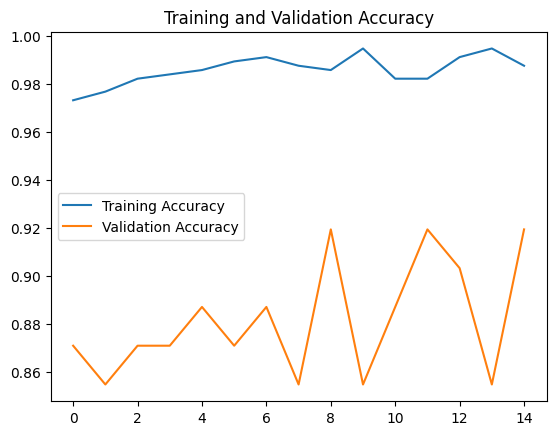

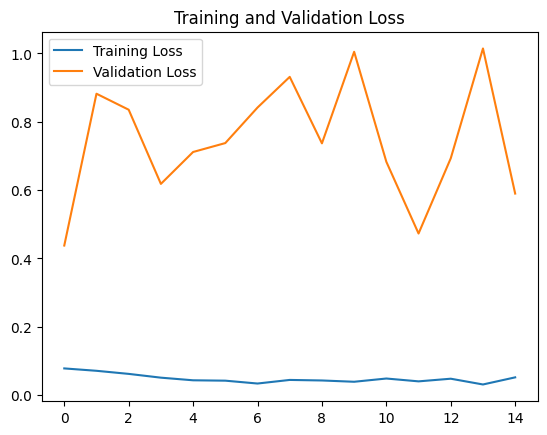

In [103]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

# Plot training history
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()

plt.plot(history.history['loss'], label="Training Loss")
plt.plot(history.history['val_loss'], label="Validation Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.show()



---

**Detecting Faces from an Image and Predicting Gender**


---



In [67]:
# Load Haar Cascade for face detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Function to predict gender on a given face image
def predict_gender_on_image(face_img, model):

    face_img = cv2.resize(face_img, (100, 100))  # Resize to 100x100

    face_img = cv2.cvtColor(face_img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    face_img = face_img / 255.0
    face_img = face_img.reshape(1, 100, 100, 1)

    # Get predictions
    predictions = model.predict(face_img)
    gender = "Male" if predictions[0][0] > predictions[0][1] else "Female"
    confidence = max(predictions[0]) * 100
    return gender, confidence



---

# Examples showcasing the model:


---



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


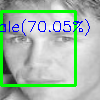

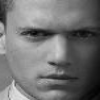

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


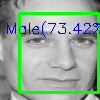

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


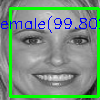

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


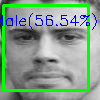

In [89]:
def display_random_images_with_predictions(X_test, model, num_images=20):
    random_indices = random.sample(range(len(X_test)), num_images)

    for idx in random_indices:
        img = X_test[idx]
        img = img.reshape(100, 100)
        img = (img * 255).astype(np.uint8)
        img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)


        gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))


        for (x, y, w, h) in faces:
            face = img_color[y:y+h, x:x+w]

            gender, confidence = predict_gender_on_image(face, model)


            cv2.rectangle(img_color, (x, y), (x+w, y+h), (0, 255, 0), 2)


            label = f"{gender}({confidence:.2f}%)"
            label_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)[0]
            label_x = x + (w - label_size[0]) // 2  #
            label_y = y - 10 if y - 10 > 10 else y + 20
            cv2.putText(img_color, label, (label_x, label_y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)


        cv2_imshow(img_color)


display_random_images_with_predictions(X_test, model, num_images=5)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


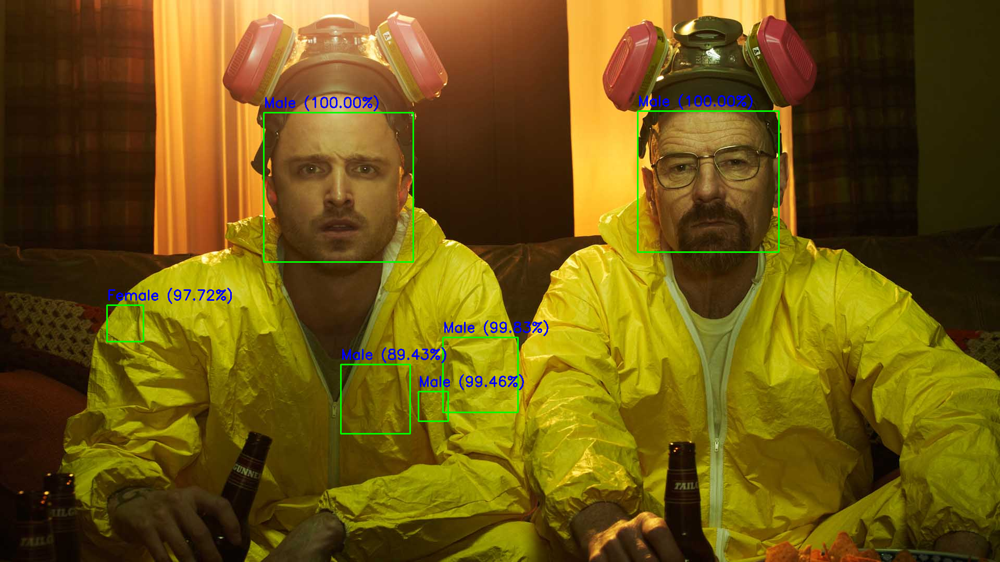

In [68]:

image_path = '/content/drive/MyDrive/FACES/FACES/bb.jpg'
img = cv2.imread(image_path)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

# For each detected face, predict gender
for (x, y, w, h) in faces:
    face = img[y:y+h, x:x+w]

    gender, confidence = predict_gender_on_image(face, model)

    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    label = f"{gender} ({confidence:.2f}%)"
    cv2.putText(img, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)


cv2_imshow(img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


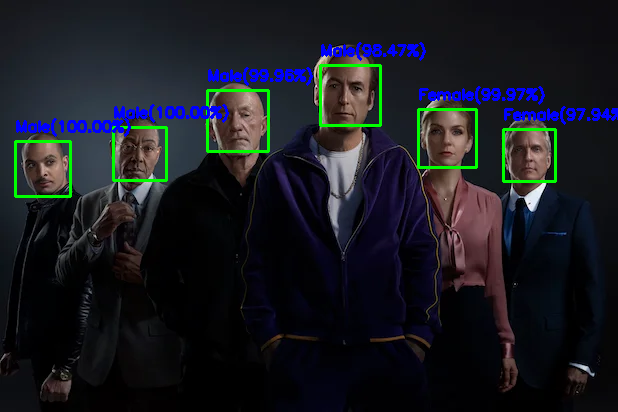

In [99]:

image_path = '/content/drive/MyDrive/FACES/FACES/bcs.jpg'
img = cv2.imread(image_path)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

# For each detected face, predict gender
for (x, y, w, h) in faces:
    face = img[y:y+h, x:x+w]

    gender, confidence = predict_gender_on_image(face, model)

    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    label = f"{gender}({confidence:.2f}%)"
    cv2.putText(img, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)


cv2_imshow(img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


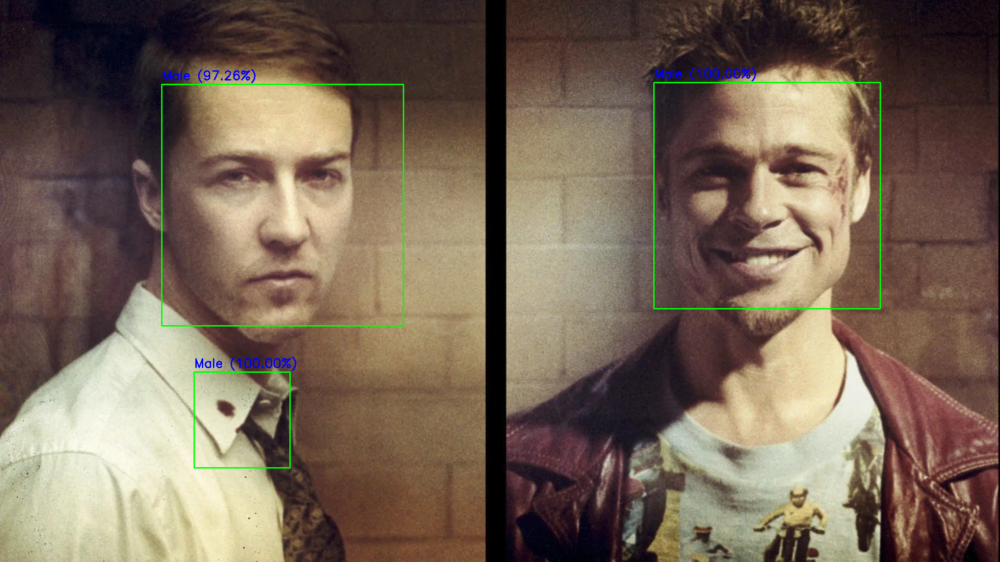

In [76]:

image_path = '/content/drive/MyDrive/FACES/FACES/20-facts-might-know-fight-club.webp'
img = cv2.imread(image_path)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

# For each detected face, predict gender
for (x, y, w, h) in faces:
    face = img[y:y+h, x:x+w]

    gender, confidence = predict_gender_on_image(face, model)

    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    label = f"{gender} ({confidence:.2f}%)"
    cv2.putText(img, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)


cv2_imshow(img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


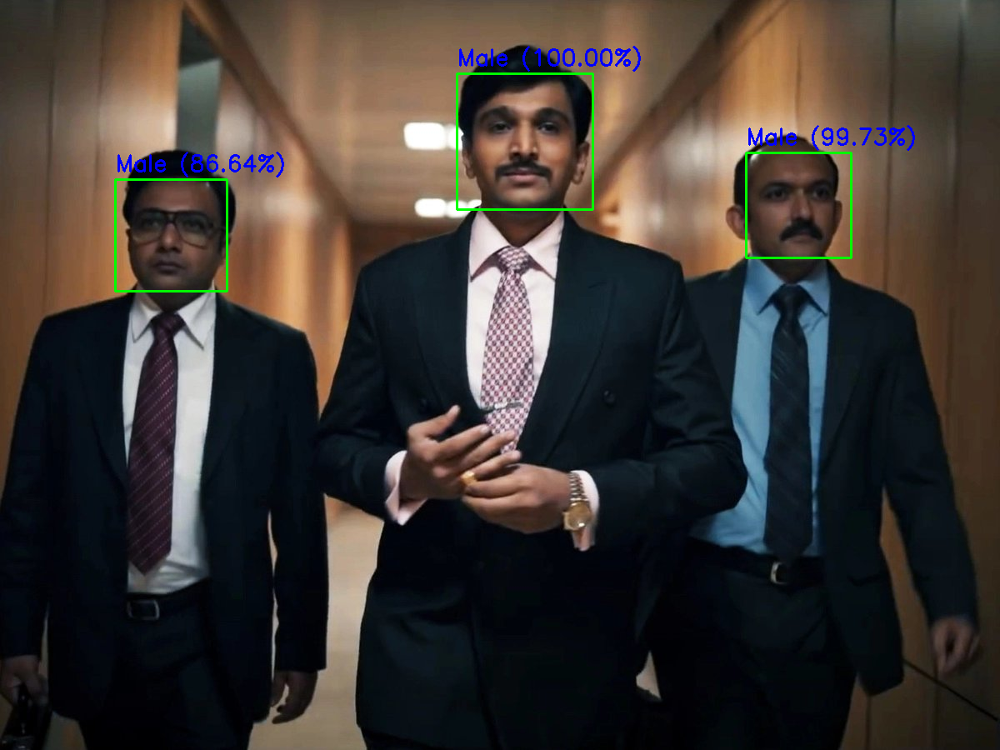

In [60]:

image_path = '/content/drive/MyDrive/FACES/FACES/s.jpg'
img = cv2.imread(image_path)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

# For each detected face, predict gender
for (x, y, w, h) in faces:
    face = img[y:y+h, x:x+w]

    gender, confidence = predict_gender_on_image(face, model)

    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    label = f"{gender} ({confidence:.2f}%)"
    cv2.putText(img, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)


cv2_imshow(img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


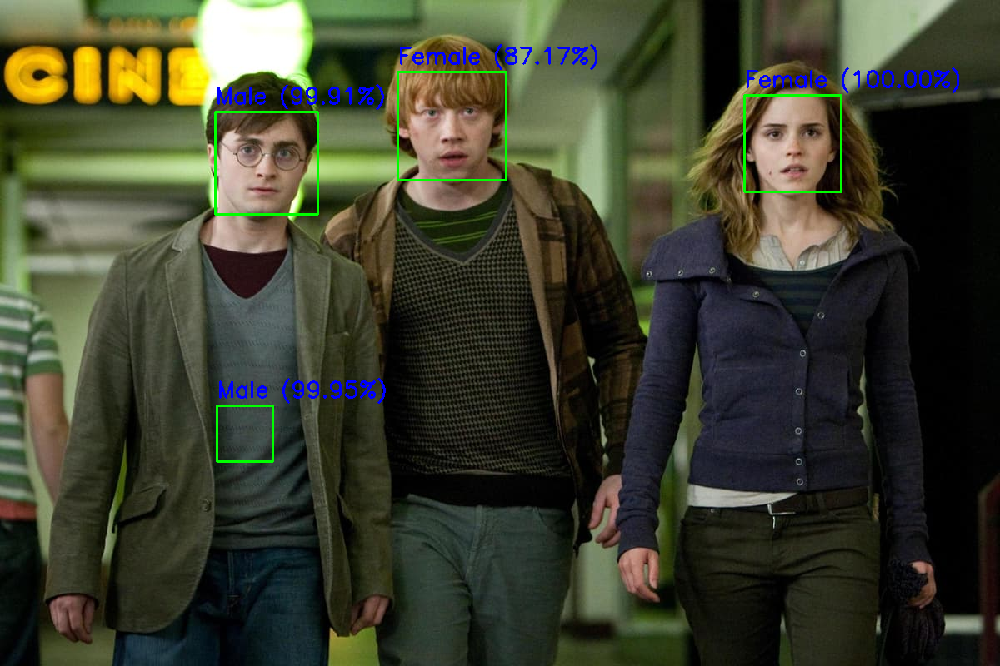

In [100]:
image_path = '/content/drive/MyDrive/FACES/FACES/b25lY21zOmQ1ODM5YjRmLTU5MTMtNGYzNy1hMGEzLTEyM2RkYmQzYzVmOTpmZDYyNjk3MC00NDVhLTQ2MTQtYjE4Yi05OWFlZDdjNWMzMWI=.jpg'
img = cv2.imread(image_path)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

# For each detected face, predict gender
for (x, y, w, h) in faces:
    face = img[y:y+h, x:x+w]

    gender, confidence = predict_gender_on_image(face, model)

    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    label = f"{gender} ({confidence:.2f}%)"
    cv2.putText(img, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)


cv2_imshow(img)
